# Mock Challenge Level 1 --- `provabgs` mocks

In [1]:
import os
import pickle
import numpy as np 
# --- plotting --- 
import corner as DFM
import matplotlib as mpl
import matplotlib.pyplot as plt
#if 'NERSC_HOST' not in os.environ.keys():
#    mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False

In [2]:
import gqp_mc.util as UT

In [3]:
from provabgs import infer as Infer
from provabgs import models as Models

/global/u1/c/chahah/projects/provabgs/src/provabgs/models.py:25: UserWarning: import error with fsps; only use emulators
  warnings.warn('import error with fsps; only use emulators')


In [4]:
prior = Infer.load_priors([
    Infer.UniformPrior(9., 12., label='sed'), 
    Infer.FlatDirichletPrior(4, label='sed'),   # flat dirichilet priors
    Infer.UniformPrior(0., 1., label='sed'), # burst fraction
    Infer.UniformPrior(0., 13.27, label='sed'), # tburst
    Infer.UniformPrior(6.9e-5, 7.3e-3, label='sed'),# uniform priors on ZH coeff
    Infer.UniformPrior(6.9e-5, 7.3e-3, label='sed'),# uniform priors on ZH coeff
    Infer.UniformPrior(0., 3., label='sed'),        # uniform priors on dust1 
    Infer.UniformPrior(0., 3., label='sed'),        # uniform priors on dust2
    Infer.UniformPrior(-2.2, 0.4, label='sed')     # uniform priors on dust_index 
])

# read mock spectra

In [5]:
theta_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/provabgs_mocks/provabgs_mock.theta.npy')

flux_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_p1.flux.npy')
ivar_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_p1.ivar.npy')

z_obs = 0.2

In [6]:
unt_theta_obs = prior.untransform(theta_obs)

In [7]:
m_nmf = Models.NMF(burst=True, emulator=True)

[Text(0, 0, 'g'),
 Text(0, 0, 'r'),
 Text(0, 0, 'z'),
 Text(0, 0, 'W1'),
 Text(0, 0, 'W2')]

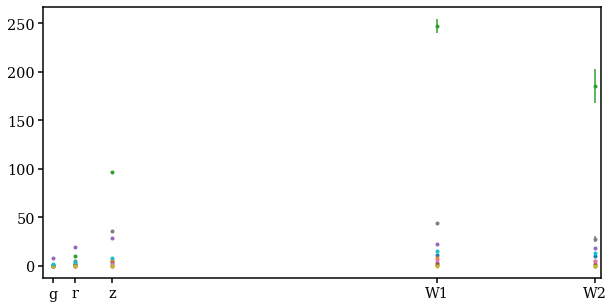

In [8]:
fig = plt.figure(figsize=(10,5))
sub = fig.add_subplot(111)
for ii, f, i in zip(range(10), flux_obs, ivar_obs): 
    sub.errorbar([4720., 6415., 9260., 34000, 46000.], f, yerr=i**-0.5, fmt='.C%i' % ii)
sub.set_xlim(4000, 46500)
sub.set_xticks([4720., 6415., 9260., 34000, 46000.])
sub.set_xticklabels(['g', 'r', 'z', 'W1', 'W2'])
#sub.set_ylim(0., 20)

# load in MCMC chains run on cori

In [9]:
desi_mcmc = Infer.desiMCMC(model=m_nmf, prior=prior)

In [10]:
chain_dir = os.path.join(UT.dat_dir(), 'mini_mocha', 'provabgs_mocks')
f_chain = lambda i: os.path.join(chain_dir, 'P1.provabgs.%i.chain.p' % i)

In [11]:
igals, chains = [], []
for i in range(100): 
    if os.path.isfile(f_chain(i)): 
        igals.append(i)
        chains.append(pickle.load(open(f_chain(i), 'rb')))

In [12]:
print(len(igals))

100


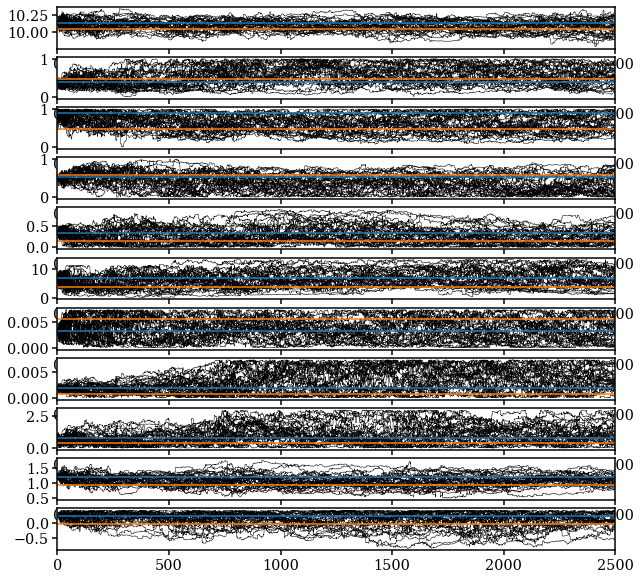

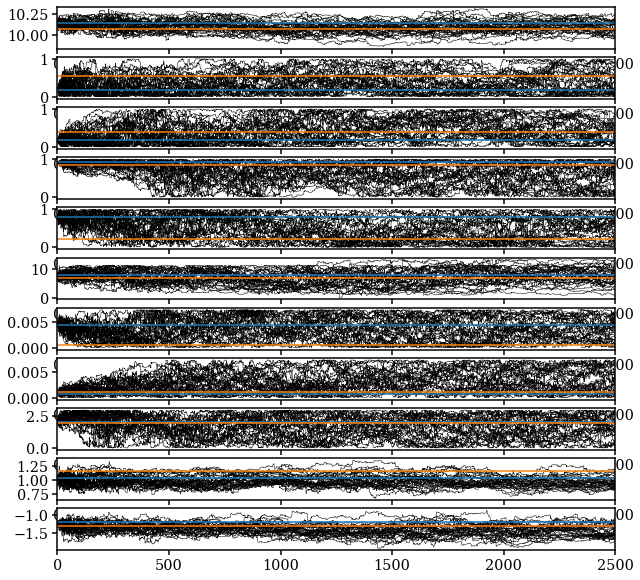

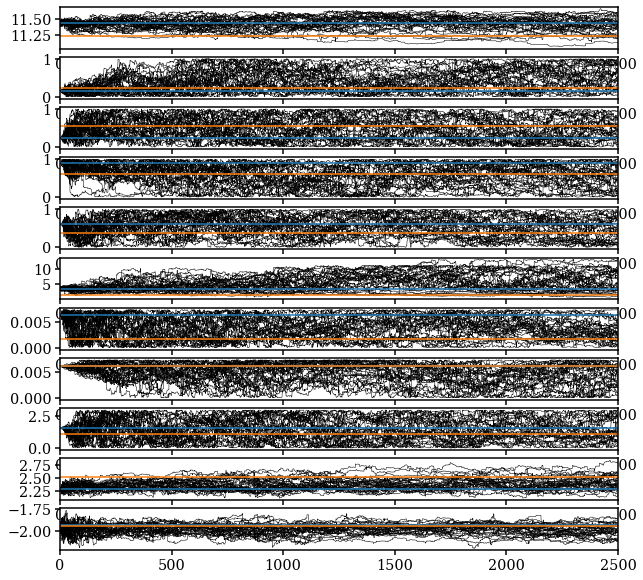

In [13]:
# examine the chains     
for i, chain in zip(igals[:3], chains): 
    unt_theta_bf = prior.untransform(chain['theta_bestfit'])
    fig = plt.figure(figsize=(10, 10))
    for ii in range(theta_obs.shape[1]-1): 
        sub = fig.add_subplot(theta_obs.shape[1]-1, 1, ii+1)
        for j in range(30): 
            unt_chain_i = desi_mcmc.prior.untransform(chain['mcmc_chain'][:,j,:])
            sub.plot(unt_chain_i[:,ii], c='k', lw=0.5)
        sub.axhline(unt_theta_obs[i][ii], color='C0')
        sub.axhline(unt_theta_bf[ii], color='C1')
        sub.set_xlim(0,2500)

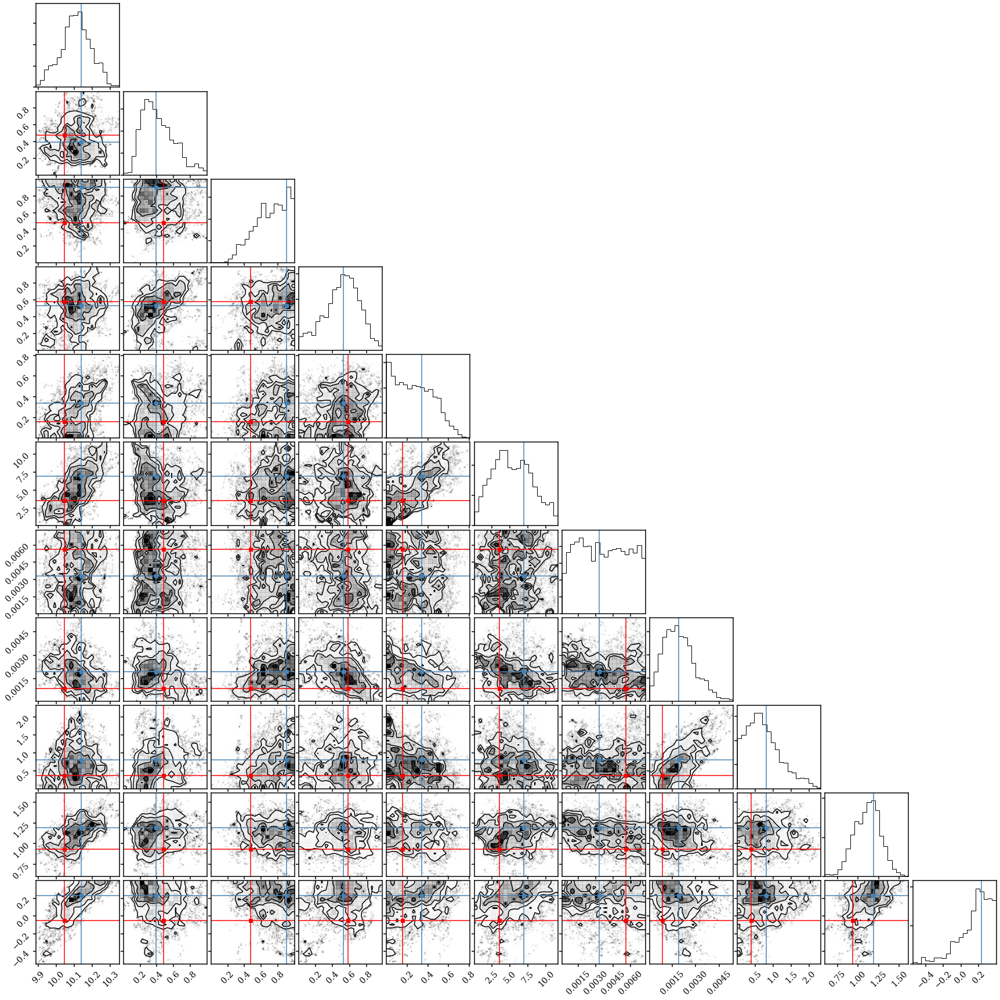

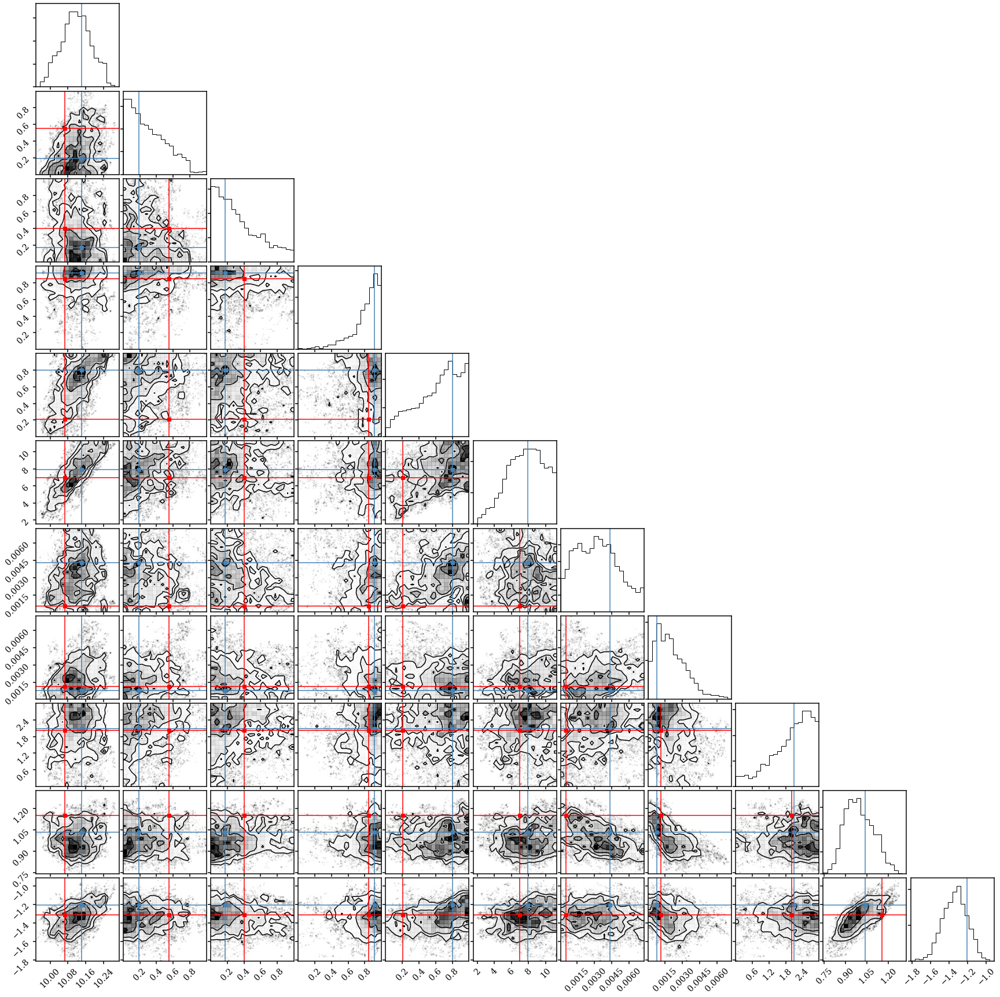

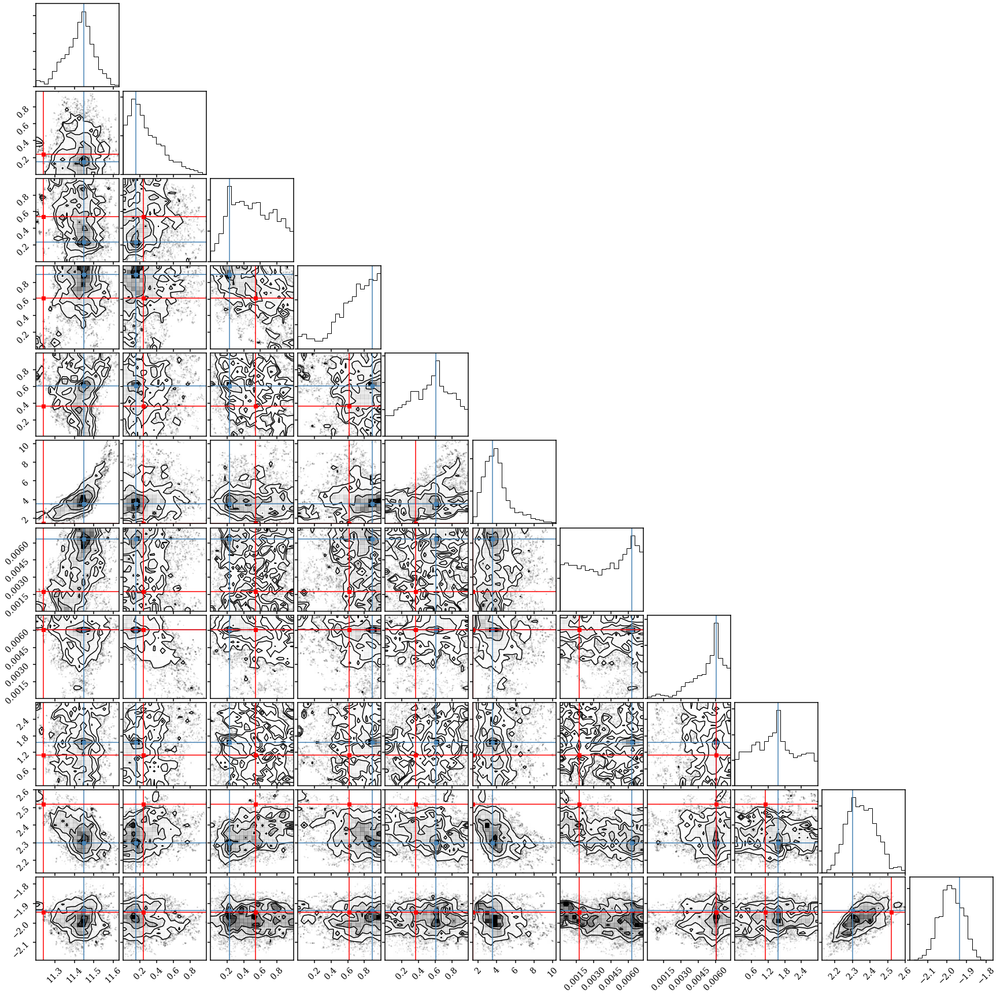

In [14]:
# examine the chains     
for i, chain in zip(igals[:3], chains): 
    unt_theta_bf = prior.untransform(chain['theta_bestfit'])
    unt_chain = prior.untransform(desi_mcmc._flatten_chain(chain['mcmc_chain'][:500,:,:]))
    
    fig = DFM.corner(unt_chain, truths=unt_theta_obs[i])
    
    axes = np.array(fig.axes).reshape((unt_theta_obs.shape[1], unt_theta_obs.shape[1]))

    # Loop over the histograms
    for yi in range(unt_theta_obs.shape[1]):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(unt_theta_bf[xi], color="r")
            ax.axhline(unt_theta_bf[yi], color="r")
            ax.plot(unt_theta_bf[xi], unt_theta_bf[yi], "sr")

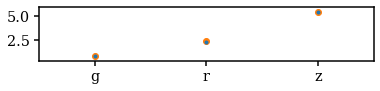

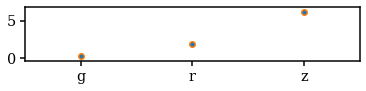

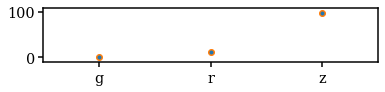

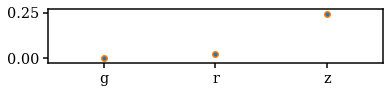

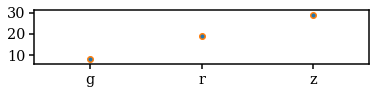

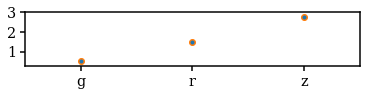

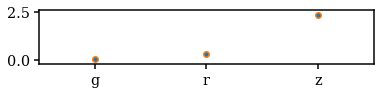

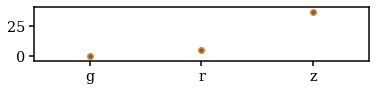

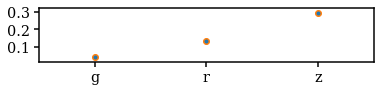

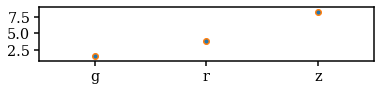

In [15]:
# examine the chains     
for i, chain in zip(igals[:10], chains): 
    fig = plt.figure(figsize=(6,1))
    sub = fig.add_subplot(111)
    sub.errorbar(range(3), flux_obs[i][:3], yerr=ivar_obs[i][:3]**-0.5, fmt='.C0')
    sub.scatter(range(3), chain['flux_photo_model'], c='C1')
    sub.set_xlim(-0.5, 2.5)
    sub.set_xticks(range(3))
    sub.set_xticklabels(['g', 'r', 'z'])

In [16]:
flat_chains = []
logMstar_true, logMstar_inf = [], [] 
logSSFR_true, logSSFR_inf = [], [] 
logZ_MW_true, logZ_MW_inf = [], []

for i, chain in zip(igals, chains): 
    flat_chain = desi_mcmc._flatten_chain(chain['mcmc_chain'][500:,:,:])       
    flat_chains.append(flat_chain)
    
    logMstar_true.append(theta_obs[i][0])
    logMstar_inf.append(flat_chain[:,0])
    
    logSSFR_true.append(np.log10(m_nmf.avgSFR(theta_obs[i], z_obs, dt=1.0)) - theta_obs[i][0])
    logSSFR_inf.append(np.log10(m_nmf.avgSFR(flat_chain, z_obs, dt=1.0)) - flat_chain[:,0])
    
    logZ_MW_true.append(np.log10(m_nmf.Z_MW(theta_obs[i], m_nmf.cosmo.age(z_obs).value)))
    logZ_MW_inf.append(np.log10(m_nmf.Z_MW(flat_chain, m_nmf.cosmo.age(z_obs).value)))
    
flat_chains = np.array(flat_chains)

logMstar_true = np.array(logMstar_true)
logMstar_inf = np.array(logMstar_inf)

logSSFR_true = np.array(logSSFR_true).flatten()
logSSFR_inf = np.array(logSSFR_inf)

logZ_MW_true = np.array(logZ_MW_true).flatten()
logZ_MW_inf = np.array(logZ_MW_inf)

# dust parameters
dust1_true = np.array([theta_obs[i][-3] for i in igals])
dust1_inf = np.array([flat_chain[:,-3] for flat_chain in flat_chains])

dust2_true = np.array([theta_obs[i][-2] for i in igals])
dust2_inf = np.array([flat_chain[:,-2] for flat_chain in flat_chains])

dust_index_true = np.array([theta_obs[i][-1] for i in igals])
dust_index_inf = np.array([flat_chain[:,-1] for flat_chain in flat_chains])

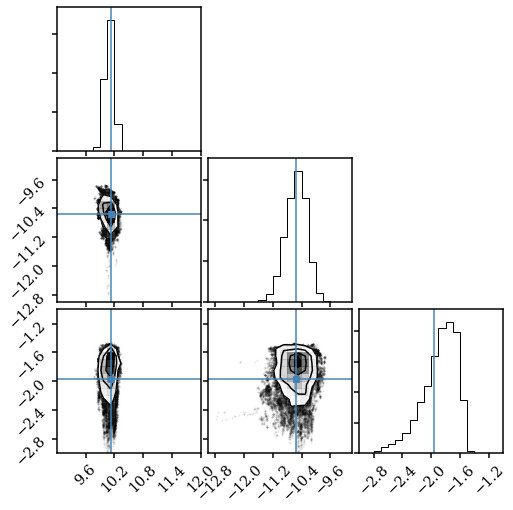

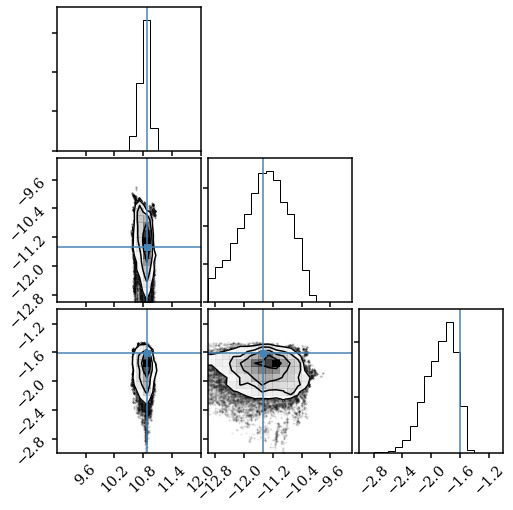

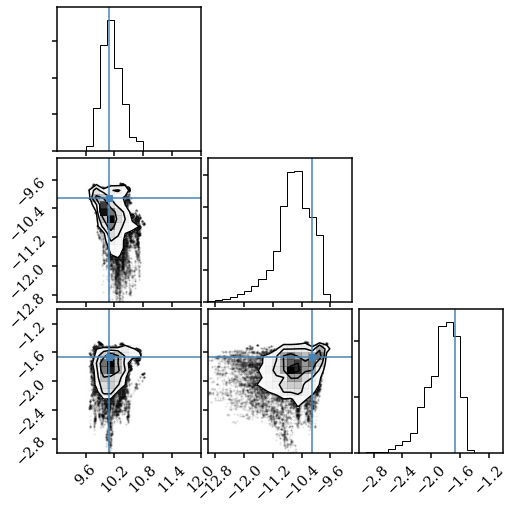

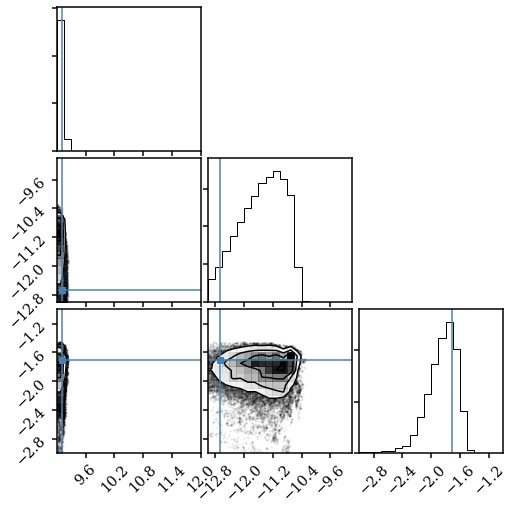

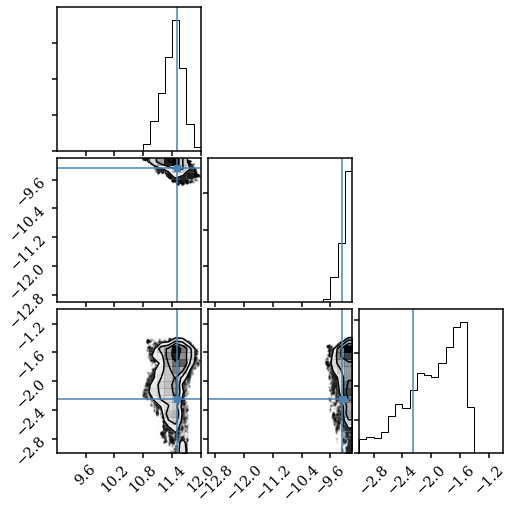

In [17]:
for i in range(50)[::10]: 
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i], logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i], logZ_MW_true[i]])
    DFM.corner(theta_deriv.T, 
               truths=theta_true, 
              range=[(9, 12), (-13, -9.), (-3., -1)])

In [18]:
# lets calculate the median, +/- sigma for each of the derived properties
logm_q = np.array([DFM.quantile(logMstar_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
logssfr_q = np.array([DFM.quantile(logSSFR_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
logzmw_q = np.array([DFM.quantile(logZ_MW_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
dust1_q = np.array([DFM.quantile(dust1_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
dust2_q = np.array([DFM.quantile(dust2_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
dust_index_q = np.array([DFM.quantile(dust_index_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])

(-2.2, 0.4)

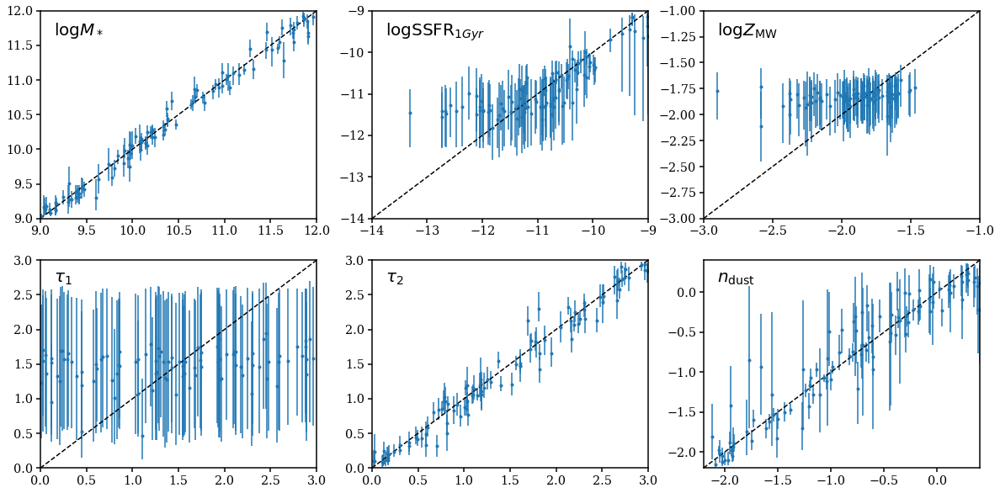

In [24]:
fig = plt.figure(figsize=(20,10))
sub = fig.add_subplot(231)
sub.errorbar(logMstar_true, logm_q[:,1], 
             yerr=[logm_q[:,1]-logm_q[:,0], logm_q[:,2]-logm_q[:,1]],
             fmt='.C0')
sub.plot([9., 12.], [9., 12], c='k', ls='--')
sub.text(0.05, 0.95, r'$\log M_*$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.set_xlim(9., 12.)
sub.set_ylim(9., 12.)

sub = fig.add_subplot(232)
sub.errorbar(logSSFR_true, logssfr_q[:,1], 
             yerr=[logssfr_q[:,1]-logssfr_q[:,0], logssfr_q[:,2]-logssfr_q[:,1]], 
             fmt='.C0')
sub.plot([-9., -15.], [-9., -15], c='k', ls='--')
sub.text(0.05, 0.95, r'$\log {\rm SSFR}_{1Gyr}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.set_xlim(-14, -9.)
sub.set_ylim(-14, -9.)

sub = fig.add_subplot(233)
sub.errorbar(logZ_MW_true, logzmw_q[:,1], 
             yerr=[logzmw_q[:,1] - logzmw_q[:,0], logzmw_q[:,2] - logzmw_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$\log Z_{\rm MW}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([-3., -1], [-3, -1], c='k', ls='--')
sub.set_xlim(-3., -1)
sub.set_ylim(-3., -1)

sub = fig.add_subplot(234)
sub.errorbar(dust1_true, dust1_q[:,1], 
             yerr=[dust1_q[:,1] - dust1_q[:,0], dust1_q[:,2] - dust1_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$\tau_1$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([prior.range[0][-3], prior.range[1][-3]], [prior.range[0][-3], prior.range[1][-3]], c='k', ls='--')
sub.set_xlim(prior.range[0][-3], prior.range[1][-3])
sub.set_ylim(prior.range[0][-3], prior.range[1][-3])

sub = fig.add_subplot(235)
sub.errorbar(dust2_true, dust2_q[:,1], 
             yerr=[dust2_q[:,1] - dust2_q[:,0], dust2_q[:,2] - dust2_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$\tau_2$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([prior.range[0][-2], prior.range[1][-2]], [prior.range[0][-2], prior.range[1][-2]], c='k', ls='--')
sub.set_xlim(prior.range[0][-2], prior.range[1][-2])
sub.set_ylim(prior.range[0][-2], prior.range[1][-2])

sub = fig.add_subplot(236)
sub.errorbar(dust_index_true, dust_index_q[:,1], 
             yerr=[dust_index_q[:,1] - dust_index_q[:,0], dust_index_q[:,2] - dust_index_q[:,1]], fmt='.C0')
sub.text(0.05, 0.95, r'$n_{\rm dust}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([prior.range[0][-1], prior.range[1][-1]], [prior.range[0][-1], prior.range[1][-1]], c='k', ls='--')
sub.set_xlim(prior.range[0][-1], prior.range[1][-1])
sub.set_ylim(prior.range[0][-1], prior.range[1][-1])

For all of the spectra we're able to reproduce $M_*$. However, for some of the spectra, we seem to be just recovering the prior for $\log{\rm SSFR}$ and $\log Z_{\rm MW}$. Lets check: 
- the bestfit spectra are good fits to the data
- Is this due to inherent degeneracies in the model? 

In [20]:
bad_ssfr = (np.abs(logSSFR_true - logssfr_q[:,1]) > 1.) | (np.abs(logZ_MW_true - logzmw_q[:,1]) > 0.5)

(-3.0, -1)

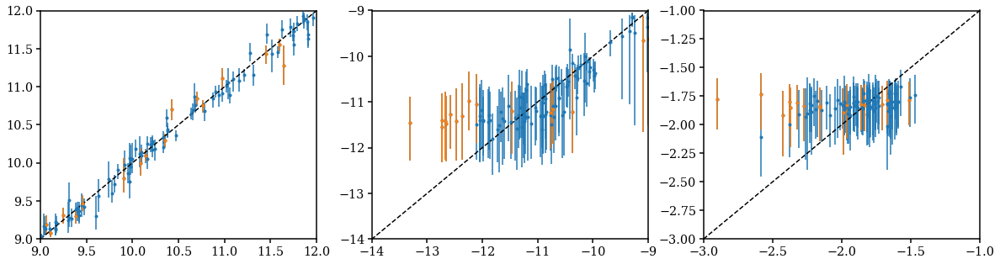

In [21]:
fig = plt.figure(figsize=(20, 5))
sub = fig.add_subplot(131)
sub.errorbar(logMstar_true, logm_q[:,1], 
             yerr=[logm_q[:,1]-logm_q[:,0], logm_q[:,2]-logm_q[:,1]],
             fmt='.C0')
sub.errorbar(logMstar_true[bad_ssfr], logm_q[bad_ssfr,1], 
             yerr=[logm_q[bad_ssfr,1]-logm_q[bad_ssfr,0], logm_q[bad_ssfr,2]-logm_q[bad_ssfr,1]],
             fmt='.C1')
sub.plot([9., 12.], [9., 12], c='k', ls='--')
sub.set_xlim(9., 12.)
sub.set_ylim(9., 12.)

sub = fig.add_subplot(132)
sub.errorbar(logSSFR_true, logssfr_q[:,1], 
             yerr=[logssfr_q[:,1]-logssfr_q[:,0], logssfr_q[:,2]-logssfr_q[:,1]], 
             fmt='.C0')
sub.errorbar(logSSFR_true[bad_ssfr], logssfr_q[bad_ssfr,1], 
             yerr=[logssfr_q[bad_ssfr,1]-logssfr_q[bad_ssfr,0], logssfr_q[bad_ssfr,2]-logssfr_q[bad_ssfr,1]], 
             fmt='.C1')
sub.plot([-9., -15.], [-9., -15], c='k', ls='--')
sub.set_xlim(-14, -9.)
sub.set_ylim(-14, -9.)

sub = fig.add_subplot(133)
sub.errorbar(logZ_MW_true, logzmw_q[:,1], 
             yerr=[logzmw_q[:,1] - logzmw_q[:,0], logzmw_q[:,2] - logzmw_q[:,1]], 
             fmt='.C0')
sub.errorbar(logZ_MW_true[bad_ssfr], logzmw_q[bad_ssfr,1], 
             yerr=[logzmw_q[bad_ssfr,1] - logzmw_q[bad_ssfr,0], logzmw_q[bad_ssfr,2] - logzmw_q[bad_ssfr,1]], 
             fmt='.C1')
sub.plot([-3., -1], [-3, -1], c='k', ls='--')
sub.set_xlim(-3., -1)
sub.set_ylim(-3., -1)

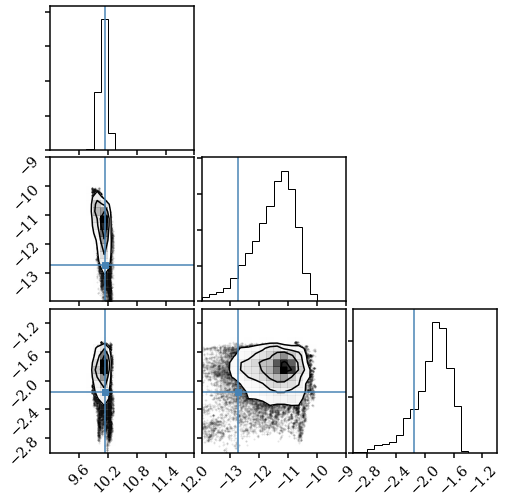

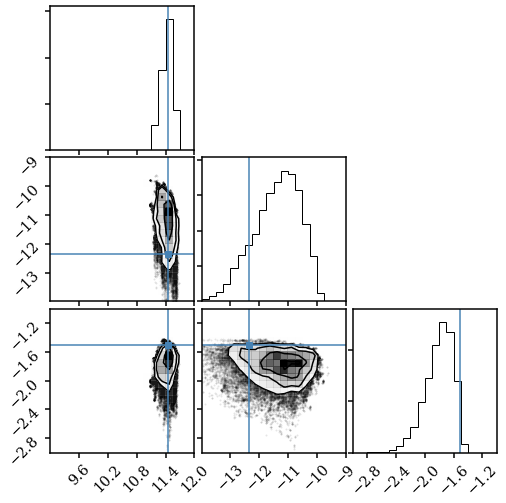

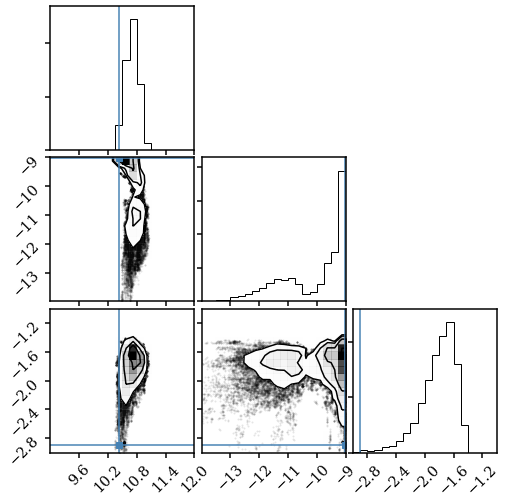

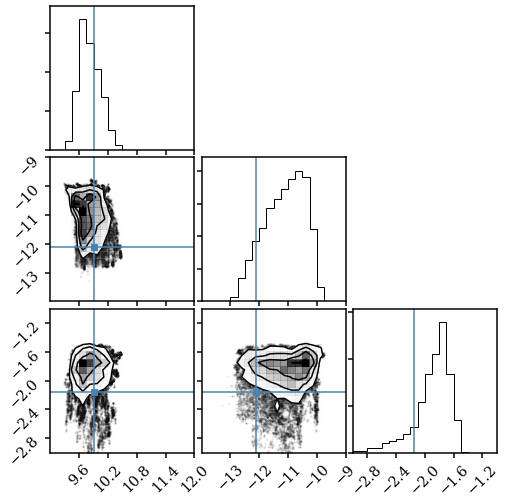

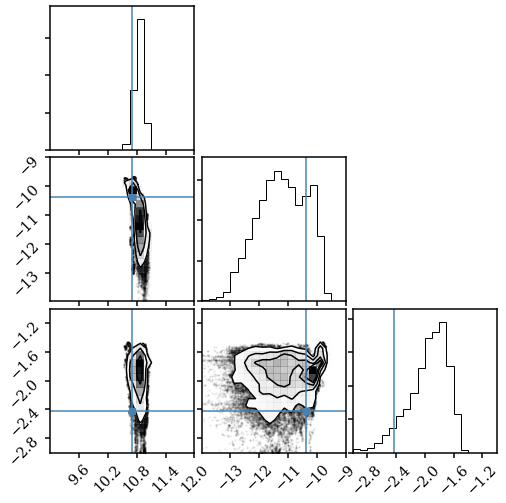

...

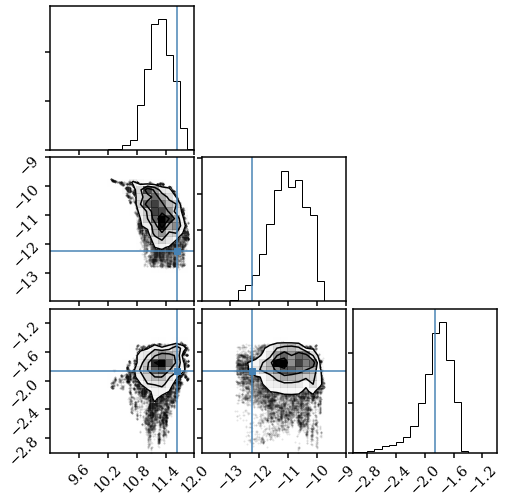

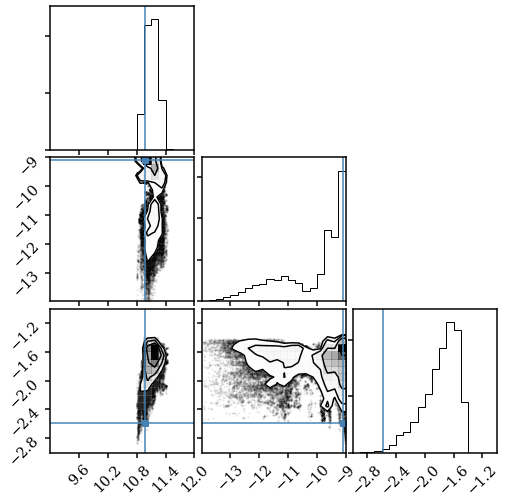

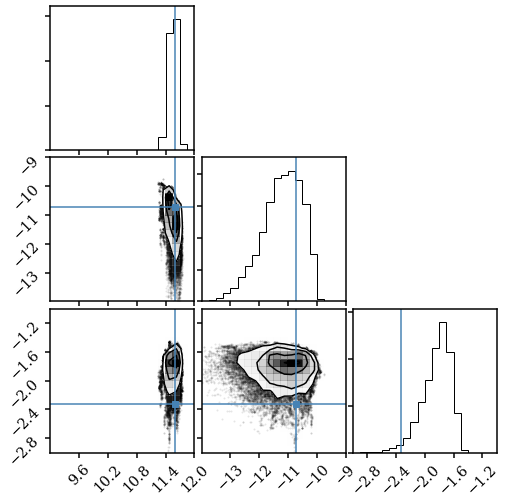

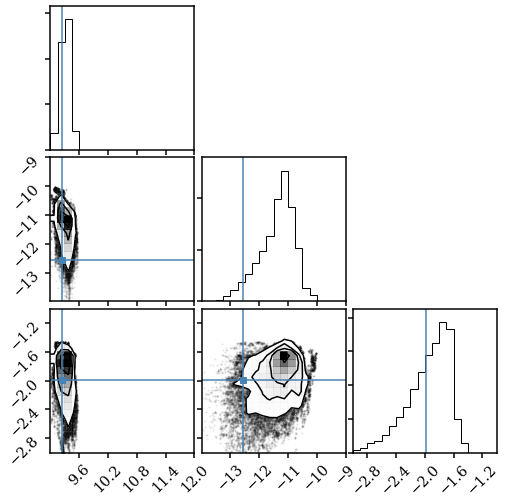

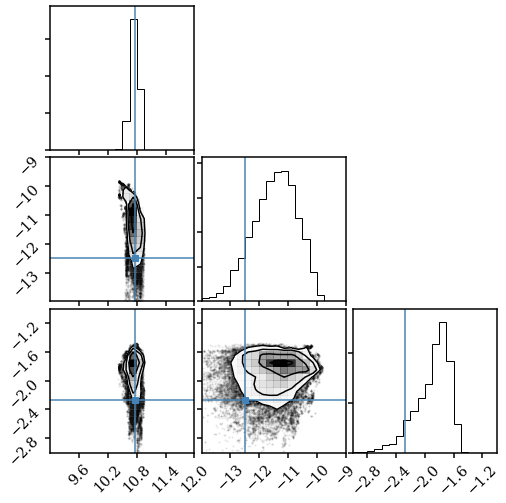

In [22]:
for i in np.arange(len(bad_ssfr))[bad_ssfr]: 
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i], logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i], logZ_MW_true[i]])
    DFM.corner(theta_deriv.T, 
               truths=theta_true, 
              range=[(9, 12), (-14, -9.), (-3., -1)])

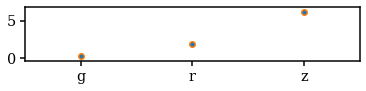

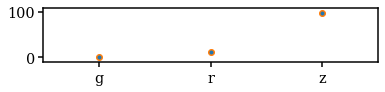

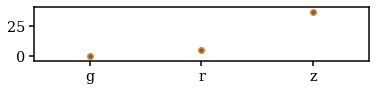

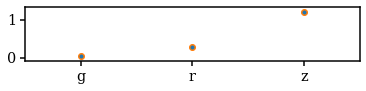

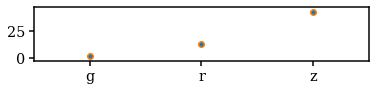

...

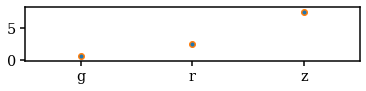

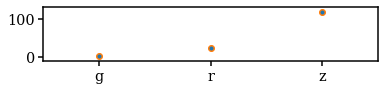

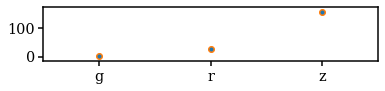

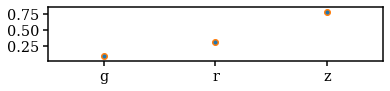

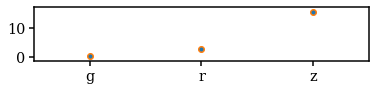

In [23]:
# examine the chains     
for ii, igal in enumerate(np.arange(len(bad_ssfr))[bad_ssfr]): 
    fig = plt.figure(figsize=(6,1))
    sub = fig.add_subplot(111)
    sub.errorbar(range(3), flux_obs[igal][:3], yerr=ivar_obs[igal][:3]**-0.5, fmt='.C0')
    sub.scatter(range(3), chains[igal]['flux_photo_model'], c='C1')
    sub.set_xlim(-0.5, 2.5)
    sub.set_xticks(range(3))
    sub.set_xticklabels(['g', 'r', 'z'])